## Before you start

Let's make sure that we have access to GPU. We can use `nvidia-smi` command to do that. In case of any problems navigate to `Edit` -> `Notebook settings` -> `Hardware accelerator`, set it to `GPU`, and then click `Save`.

In [ ]:
!nvidia-smi

Mon Jul 17 01:35:37 2023       
+-----------------------------------------------------------------------------+
| NVIDIA-SMI 525.105.17   Driver Version: 525.105.17   CUDA Version: 12.0     |
|-------------------------------+----------------------+----------------------+
| GPU  Name        Persistence-M| Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp  Perf  Pwr:Usage/Cap|         Memory-Usage | GPU-Util  Compute M. |
|                               |                      |               MIG M. |
|===============================+======================+======================|
|   0  Tesla T4            Off  | 00000000:00:04.0 Off |                    0 |
| N/A   51C    P8    10W /  70W |      0MiB / 15360MiB |      0%      Default |
|                               |                      |                  N/A |
+-------------------------------+----------------------+----------------------+
                                                                               
+-------

In [ ]:
import os
HOME = os.getcwd()
print(HOME)

/content


## Download video

In [ ]:
!pip install gdown
import gdown

# url = input('Enter Drive Link of junction:')
url = "https://drive.google.com/uc?id=1JSANaRMQN9amKxcuC7RLxmjSvBm-RtkA"

output = '/content/vehicle-counting.mp4'
gdown.download(url, output, quiet=False)


Downloading...
From: https://drive.google.com/uc?id=1JSANaRMQN9amKxcuC7RLxmjSvBm-RtkA
To: /content/vehicle-counting.mp4
100%|██████████| 3.77M/3.77M [00:00<00:00, 263MB/s]


'/content/vehicle-counting.mp4'

In [ ]:
SOURCE_VIDEO_PATH = f"/content/vehicle-counting.mp4"

## Install YOLOv8

⚠️ YOLOv8 is still under heavy development. Breaking changes are being introduced almost weekly. We strive to make our YOLOv8 notebooks work with the latest version of the library. Last tests took place on **23.01.2023** with version **YOLOv8.0.17**.

If you notice that our notebook behaves incorrectly - especially if you experience errors that prevent you from going through the tutorial - don't hesitate! Let us know and open an [issue](https://github.com/roboflow/notebooks/issues) on the Roboflow Notebooks repository.

In [ ]:
# Pip install method (recommended)

!pip install ultralytics

from IPython import display
display.clear_output()

import ultralytics
ultralytics.checks()

Ultralytics YOLOv8.0.136 🚀 Python-3.10.12 torch-2.0.1+cu118 CUDA:0 (Tesla T4, 15102MiB)
Setup complete ✅ (2 CPUs, 12.7 GB RAM, 24.9/78.2 GB disk)


## Install ByteTrack



In [ ]:
%cd {HOME}
!git clone https://github.com/ifzhang/ByteTrack.git
%cd {HOME}/ByteTrack

# workaround related to https://github.com/roboflow/notebooks/issues/80
!sed -i 's/onnx==1.8.1/onnx==1.9.0/g' requirements.txt

!pip3 install -q -r requirements.txt
!python3 setup.py -q develop
!pip install -q cython_bbox
!pip install -q onemetric
# workaround related to https://github.com/roboflow/notebooks/issues/112 and https://github.com/roboflow/notebooks/issues/106
!pip install -q loguru lap thop

from IPython import display
display.clear_output()


import sys
sys.path.append(f"{HOME}/ByteTrack")


import yolox
print("yolox.__version__:", yolox.__version__)

yolox.__version__: 0.1.0


In [ ]:
from yolox.tracker.byte_tracker import BYTETracker, STrack
from onemetric.cv.utils.iou import box_iou_batch
from dataclasses import dataclass


@dataclass(frozen=True)
class BYTETrackerArgs:
    track_thresh: float = 0.25
    track_buffer: int = 30
    match_thresh: float = 0.8
    aspect_ratio_thresh: float = 3.0
    min_box_area: float = 1.0
    mot20: bool = False

## Install Roboflow Supervision

In [ ]:
!pip install supervision==0.1.0


from IPython import display
display.clear_output()


import supervision
print("supervision.__version__:", supervision.__version__)

supervision.__version__: 0.1.0


In [ ]:
from supervision.draw.color import ColorPalette,Color
# from supervision.geometry.dataclasses import Point
from supervision.video.dataclasses import VideoInfo
from supervision.video.source import get_video_frames_generator
from supervision.video.sink import VideoSink
from supervision.notebook.utils import show_frame_in_notebook
from supervision.tools.detections import Detections, BoxAnnotator
# from supervision.tools.line_counter import LineCounter, LineCounterAnnotator

In [ ]:
from __future__ import annotations

from dataclasses import dataclass
from typing import Tuple
from math import atan2, cos, sin, sqrt


@dataclass
class Point:
    x: float
    y: float

    def as_xy_int_tuple(self) -> Tuple[int, int]:
        return int(self.x), int(self.y)

    def as_xy_float_tuple(self) -> Tuple[float, float]:
        return self.x, self.y


@dataclass
class Vector:
    start: Point
    end: Point

    def is_in(self, point: Point) -> bool:
        v1 = Vector(self.start, self.end)
        v2 = Vector(self.start, point)
        cross_product = (v1.end.x - v1.start.x) * (v2.end.y - v2.start.y) - (
            v1.end.y - v1.start.y
        ) * (v2.end.x - v2.start.x)
        return cross_product < 0


@dataclass
class Rect:
    x: float
    y: float
    width: float
    height: float

    @property
    def top_left(self) -> Point:
        return Point(x=self.x, y=self.y)

    @property
    def bottom_right(self) -> Point:
        return Point(x=self.x + self.width, y=self.y + self.height)

    def pad(self, padding) -> Rect:
        return Rect(
            x=self.x - padding,
            y=self.y - padding,
            width=self.width + 2 * padding,
            height=self.height + 2 * padding,
        )


@dataclass
class Circle:
    center: Point
    radius: float

    def is_in(self, point: Point) -> bool:
        """
        Check if a point is inside or outside the circle.

        :param point: Point : The point to check.
        :return: bool : True if the point is inside the circle, False otherwise.
        """
        distance = ((point.x - self.center.x) ** 2 + (point.y - self.center.y) ** 2) ** 0.5
        return distance <= self.radius


@dataclass
class Ellipse:
    center: Point
    major_axis: float
    minor_axis: float
    angle: float

    def is_in(self, point: Point) -> bool:
        """
        Check if a point is inside or outside the ellipse.

        :param point: Point : The point to check.
        :return: bool : True if the point is inside the ellipse, False otherwise.
        """
        dx = point.x - self.center.x
        dy = point.y - self.center.y
        angle = atan2(dy, dx) - self.angle
        x = dx * cos(-self.angle) - dy * sin(-self.angle)
        y = dx * sin(-self.angle) + dy * cos(-self.angle)
        return (x / self.major_axis) ** 2 + (y / self.minor_axis) ** 2 <= 1



# Define Ellipse Counter

In [ ]:
import math
from typing import Dict


class EllipseCounter:
    def __init__(self, center: Point, major_axis: float, minor_axis: float, angle: float):
        """
        Initialize an EllipseCounter object.

        :param center: Point : The center point of the ellipse.
        :param major_axis: float : The length of the major axis of the ellipse.
        :param minor_axis: float : The length of the minor axis of the ellipse.
        :param angle: float : The angle of rotation of the ellipse in radians.
        """
        self.ellipse = Ellipse(center=center, major_axis=major_axis, minor_axis=minor_axis, angle=angle)
        self.tracker_state: Dict[str, bool] = {}
        self.in_count_left: int = 0
        self.in_count_right: int = 0
        self.in_count_top: int = 0
        self.in_count_bottom: int = 0

    def update(self, detections: Detections):
        """
        Update the in_count for the detections that cross the ellipse.

        :param detections: Detections : The detections for which to update the counts.
        """

        for xyxy, confidence, class_id, tracker_id in detections:
            # handle detections with no tracker_id
            if tracker_id is None:
                continue

            # we check if all four corners of bbox are inside or outside the ellipse
            x1, y1, x2, y2 = xyxy
            corners = [
                Point(x=x1, y=y1),
                Point(x=x1, y=y2),
                Point(x=x2, y=y1),
                Point(x=x2, y=y2),
            ]
            triggers = [self.ellipse.is_in(point=corner) for corner in corners]

            # detection is partially in and partially out
            if len(set(triggers)) == 1:
                continue

            # Change this line to check if any corner is inside the ellipse
            tracker_state = any(triggers)

            # handle new detection
            if tracker_id not in self.tracker_state:
                self.tracker_state[tracker_id] = tracker_state
                # Update in_count for objects initially inside the ellipse
                if tracker_state:
                    if x1 < self.ellipse.center.x:
                        self.in_count_left += 1
                    else:
                        self.in_count_right += 1

                    if y1 < self.ellipse.center.y:
                        self.in_count_top += 1
                    else:
                        self.in_count_bottom += 1

                continue

            # handle detection on the same side of the ellipse
            if self.tracker_state.get(tracker_id) == tracker_state:
                continue

            self.tracker_state[tracker_id] = tracker_state
            if tracker_state:
                if x1 < self.ellipse.center.x:
                    self.in_count_left += 1
                else:
                    self.in_count_right += 1

                if y1 < self.ellipse.center.y:
                    self.in_count_top += 1
                else:
                    self.in_count_bottom += 1
class EllipseCounterAnnotator:
    def __init__(
            self,
            thickness: float = 1,
            color: Color = Color.white(),
            text_thickness: float = 1,
            text_color: Color = Color.black(),
            text_scale: float = 0.4,
            text_offset: float = 0.5,
            text_padding: int = 5,
    ):
        """
        Initialize the EllipseCounterAnnotator object with default values.

        :param thickness: float : The thickness of the ellipse that will be drawn.
        :param color: Color : The color of the ellipse that will be drawn.
        :param text_thickness: float : The thickness of the text that will be drawn.
        :param text_color: Color : The color of the text that will be drawn.
        :param text_scale: float : The scale of the text that will be drawn.
        :param text_offset: float : The offset of the text that will be drawn.
        :param text_padding: int : The padding of the text that will be drawn.
        """
        self.thickness: float = thickness
        self.color: Color = color
        self.text_thickness: float = text_thickness
        self.text_color: Color = text_color
        self.text_scale: float = text_scale
        self.text_offset: float = text_offset
        self.text_padding: int = text_padding

    def annotate(self, frame: np.ndarray, ellipse_counter: EllipseCounter) -> np.ndarray:
        """
        Draws the ellipse on the frame using the ellipse_counter provided.

        :param frame: np.ndarray : The image on which the ellipse will be drawn
        :param ellipse_counter: EllipseCounter : The ellipse counter that will be used to draw the ellipse
        :return: np.ndarray : The image with the ellipse drawn on it
        """
        center = ellipse_counter.ellipse.center.as_xy_int_tuple()
        axes = (int(ellipse_counter.ellipse.major_axis), int(ellipse_counter.ellipse.minor_axis))
        angle = ellipse_counter.ellipse.angle * 180 / math.pi
        cv2.ellipse(frame, center, axes, angle, 0, 360, self.color.as_bgr(), self.thickness)

        in_text_left = f"in left: {ellipse_counter.in_count_left}"
        in_text_right = f"in right: {ellipse_counter.in_count_right}"
        in_text_top = f"in top: {ellipse_counter.in_count_top}"
        in_text_bottom = f"in bottom: {ellipse_counter.in_count_bottom}"


        # Set the position of the in and out text slightly below the top right corner of the frame

        # Left Text Positioning

        in_text_left_x = frame.shape[1] - 350
        in_text_left_y = 40

        # Right Text Positioning

        in_text_right_x = frame.shape[1] - 350
        in_text_right_y = 80

        # Top Text Positioning

        in_text_top_x = frame.shape[1] - 350
        in_text_top_y = 120

        # Bottom Text Positioning

        in_text_bottom_x = frame.shape[1] - 350
        in_text_bottom_y = 160

      # Put Left Text

        cv2.putText(
            frame,
            in_text_left,
            (in_text_left_x, in_text_left_y),
            cv2.FONT_HERSHEY_SIMPLEX,
            self.text_scale,
            self.text_color.as_bgr(),
            self.text_thickness,
            cv2.LINE_AA,
        )

         # Put Right Text

        cv2.putText(
            frame,
            in_text_right,
            (in_text_right_x, in_text_right_y),
            cv2.FONT_HERSHEY_SIMPLEX,
            self.text_scale,
            self.text_color.as_bgr(),
            self.text_thickness,
            cv2.LINE_AA,
        )

         # Put Top Text

        cv2.putText(
            frame,
            in_text_top,
            (in_text_top_x, in_text_top_y),
            cv2.FONT_HERSHEY_SIMPLEX,
            self.text_scale,
            self.text_color.as_bgr(),
            self.text_thickness,
            cv2.LINE_AA,
        )

         # Put Bottom Text

        cv2.putText(
            frame,
            in_text_bottom,
            (in_text_bottom_x, in_text_bottom_y),
            cv2.FONT_HERSHEY_SIMPLEX,
            self.text_scale,
            self.text_color.as_bgr(),
            self.text_thickness,
            cv2.LINE_AA
        )

        return(frame)

## Tracking utils

Unfortunately, we have to manually match the bounding boxes coming from our model with those created by the tracker.

In [ ]:
from typing import List

import numpy as np


# converts Detections into format that can be consumed by match_detections_with_tracks function
def detections2boxes(detections: Detections) -> np.ndarray:
    return np.hstack((
        detections.xyxy,
        detections.confidence[:, np.newaxis]
    ))


# converts List[STrack] into format that can be consumed by match_detections_with_tracks function
def tracks2boxes(tracks: List[STrack]) -> np.ndarray:
    return np.array([
        track.tlbr
        for track
        in tracks
    ], dtype=float)


# matches our bounding boxes with predictions
def match_detections_with_tracks(
    detections: Detections,
    tracks: List[STrack]
) -> Detections:
    if not np.any(detections.xyxy) or len(tracks) == 0:
        return np.empty((0,))

    tracks_boxes = tracks2boxes(tracks=tracks)
    iou = box_iou_batch(tracks_boxes, detections.xyxy)
    track2detection = np.argmax(iou, axis=1)

    tracker_ids = [None] * len(detections)

    for tracker_index, detection_index in enumerate(track2detection):
        if iou[tracker_index, detection_index] != 0:
            tracker_ids[detection_index] = tracks[tracker_index].track_id

    return tracker_ids

## Load pre-trained YOLOv8 model

In [ ]:
# settings
MODEL = "yolov8x.pt"

In [ ]:
from ultralytics import YOLO

model = YOLO(MODEL)
model.fuse()

YOLOv8x summary (fused): 268 layers, 68200608 parameters, 0 gradients, 257.8 GFLOPs


## Predict and annotate single frame

In [ ]:
# dict maping class_id to class_name
CLASS_NAMES_DICT = model.model.names
# class_ids of interest - car, motorcycle, bus and truck
CLASS_ID = [2, 3, 5, 7]


0: 384x640 5 persons, 6 cars, 4 motorcycles, 2 buss, 1 truck, 2 traffic lights, 77.4ms
Speed: 4.2ms preprocess, 77.4ms inference, 2.0ms postprocess per image at shape (1, 3, 384, 640)


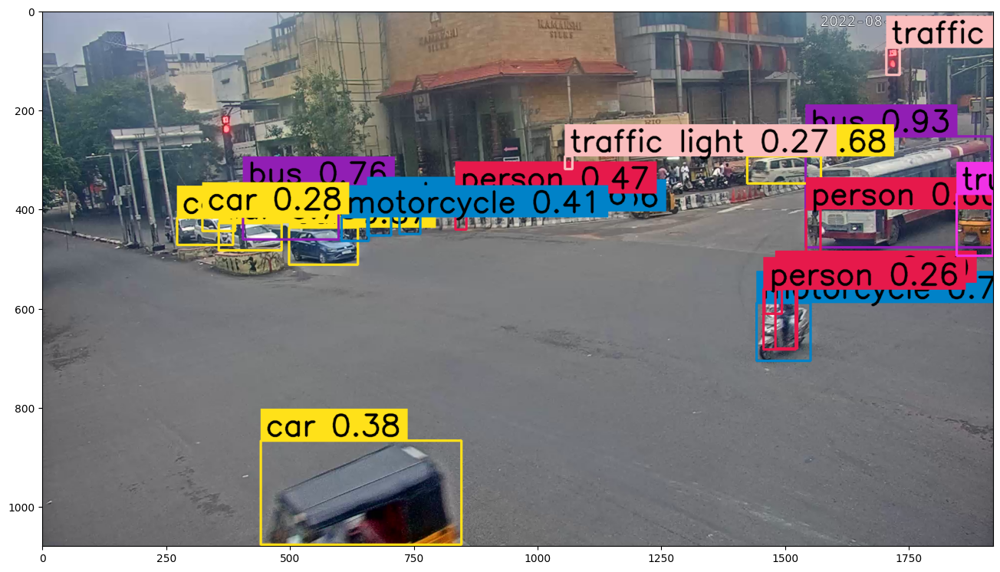

In [ ]:
# create frame generator
generator = get_video_frames_generator(SOURCE_VIDEO_PATH)
# create instance of BoxAnnotator
box_annotator = BoxAnnotator(color=ColorPalette(), thickness=4, text_thickness=4, text_scale=2)
# acquire first video frame
iterator = iter(generator)
frame = next(iterator)
# model prediction on single frame and conversion to supervision Detections
results = model(frame)
detections = Detections(
    xyxy=results[0].boxes.xyxy.cpu().numpy(),
    confidence=results[0].boxes.conf.cpu().numpy(),
    class_id=results[0].boxes.cls.cpu().numpy().astype(int)
)
# format custom labels
labels = [
    f"{CLASS_NAMES_DICT[class_id]} {confidence:0.2f}"
    for _, confidence, class_id, tracker_id
    in detections
]
# annotate and display frame
frame = box_annotator.annotate(frame=frame, detections=detections, labels=labels)

%matplotlib inline
show_frame_in_notebook(frame, (16, 16))

## Predict and annotate whole video

In [ ]:
!rm '/content/vehicle-counting-result.mp4'
!rm "/content/vehicle-counting-result_compressed.mp4"

In [ ]:
# at Patny X Roads CCTV Footage
ELLIPSE_CENTER = Point(925, 700)
ELLIPSE_MAJOR_AXIS = 800
ELLIPSE_MINOR_AXIS = 350
ELLIPSE_ANGLE = 0
TARGET_VIDEO_PATH = f"{HOME}/vehicle-counting-result.mp4"

In [ ]:
VideoInfo.from_video_path(SOURCE_VIDEO_PATH)

VideoInfo(width=1920, height=1080, fps=21, total_frames=307)

In [ ]:
from tqdm.notebook import tqdm
import time
import cv2

def get_centroid(bbox):
    x1, y1, x2, y2 = bbox
    return (int((x1 + x2) / 2), int((y1 + y2) / 2))

# Create BYTETracker instance
byte_tracker = BYTETracker(BYTETrackerArgs())
# Create VideoInfo instance
video_info = VideoInfo.from_video_path(SOURCE_VIDEO_PATH)
# Create frame generator
generator = get_video_frames_generator(SOURCE_VIDEO_PATH)
# Create EllipseCounter instance
ellipse_counter = EllipseCounter(center=ELLIPSE_CENTER, major_axis=ELLIPSE_MAJOR_AXIS, minor_axis=ELLIPSE_MINOR_AXIS, angle=ELLIPSE_ANGLE)
# Create instance of BoxAnnotator and EllipseCounterAnnotator
box_annotator = BoxAnnotator(color=ColorPalette(), thickness=4, text_thickness=4, text_scale=2)
ellipse_annotator = EllipseCounterAnnotator(thickness=4, text_thickness=4, text_scale=2)

# Variables to store initial and final coordinates and time
initial_coordinates = {}
final_coordinates = {}
initial_time = {}
final_time = {}

# Open target video file
with VideoSink(TARGET_VIDEO_PATH, video_info) as sink:
    # Loop over video frames
    for frame in tqdm(generator, total=video_info.total_frames):
        # Model prediction on single frame and conversion to supervision Detections
        results = model(frame)
        detections = Detections(
            xyxy=results[0].boxes.xyxy.cpu().numpy(),
            confidence=results[0].boxes.conf.cpu().numpy(),
            class_id=results[0].boxes.cls.cpu().numpy().astype(int)
        )
        # Filtering out detections with unwanted classes
        mask = np.array([class_id in CLASS_ID for class_id in detections.class_id], dtype=bool)
        detections.filter(mask=mask, inplace=True)
        # Tracking detections
        tracks = byte_tracker.update(
            output_results=detections2boxes(detections=detections),
            img_info=frame.shape,
            img_size=frame.shape
        )
        tracker_id = match_detections_with_tracks(detections=detections, tracks=tracks)
        detections.tracker_id = np.array(tracker_id)
        # Filtering out detections without trackers
        mask = np.array([tracker_id is not None for tracker_id in detections.tracker_id], dtype=bool)
        detections.filter(mask=mask, inplace=True)
        # Format custom labels
        labels = [
            f"#{tracker_id} {CLASS_NAMES_DICT[class_id]} {confidence:0.2f}"
            for _, confidence, class_id, tracker_id
            in detections
        ]
        # Updating ellipse counter
        ellipse_counter.update(detections=detections)

        # Track initial and final coordinates and calculate time
        current_time = time.time()
        for obj_id, (bbox, confidence, class_id, tracker_id) in enumerate(detections):
            centroid = get_centroid(bbox)
            if tracker_id not in initial_coordinates:
                initial_coordinates[tracker_id] = centroid
                initial_time[tracker_id] = current_time
            final_coordinates[tracker_id] = centroid
            final_time[tracker_id] = current_time

        # Annotate and display frame
        for obj_id, (bbox, _, class_id, tracker_id) in enumerate(detections):
            # Get centroid
            centroid = get_centroid(bbox)
            # Calculate time difference
            time_diff = final_time[tracker_id] - initial_time[tracker_id]
            # Format time text
            time_text = f"Label:{CLASS_NAMES_DICT[class_id]}"+f"Time: {time_diff:.2f}s"
            # Draw bounding box with time text
            frame = cv2.rectangle(frame, (int(bbox[0]), int(bbox[1])), (int(bbox[2]), int(bbox[3])), (0, 255, 0), 2)
            #frame = cv2.putText(frame)
	                # Display IDs at the top of the bounding boxes
            label = CLASS_NAMES_DICT[class_id]
            label_text = f"{label}"
            frame = cv2.putText(frame, label_text, (int(bbox[0]), int(bbox[1]) - 30), cv2.FONT_HERSHEY_SIMPLEX, 1,
                                (0, 255, 0), 2)

        annotated_frame = box_annotator.annotate(frame=frame, detections=detections, labels=labels)
        annotated_frame = ellipse_annotator.annotate(frame=annotated_frame, ellipse_counter=ellipse_counter)

        # Calculate and display average time
        total_time = sum(final_time[obj_id] - initial_time[obj_id] for obj_id in initial_coordinates)
        num_vehicles = len(initial_coordinates)
        average_time = total_time / num_vehicles if num_vehicles > 0 else 0.0
        avg_time_text = f"Average Time: {average_time:.2f}s"
        annotated_frame = cv2.putText(annotated_frame, avg_time_text, (10, 30), cv2.FONT_HERSHEY_SIMPLEX, 1, (0, 0, 255), 2)
        time_list = [f"Object ID: {obj_id} - Time taken: {final_time[obj_id] - initial_time[obj_id]:.2f}s" for obj_id in initial_coordinates]
        time_text = "   ".join(time_list)
        annotated_frame = cv2.putText(annotated_frame, time_text, (0, 60), cv2.FONT_HERSHEY_SIMPLEX, 0.8, (0, 0, 255), 2)
        sink.write_frame(annotated_frame)


# Print initial and final coordinates and time
for obj_id, coordinates in initial_coordinates.items():
    print(f'Object ID: {obj_id} - Initial coordinates: {coordinates}')
    print(f'Object ID: {obj_id} - Final coordinates: {final_coordinates[obj_id]}')
    print(f'Object ID: {obj_id} - Time taken: {final_time[obj_id] - initial_time[obj_id]} seconds')

print(f'Average time: {average_time:.2f}s')


  0%|          | 0/307 [00:00<?, ?it/s]


0: 384x640 5 persons, 6 cars, 4 motorcycles, 2 buss, 1 truck, 2 traffic lights, 68.2ms
Speed: 3.3ms preprocess, 68.2ms inference, 2.2ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 5 persons, 7 cars, 4 motorcycles, 2 buss, 1 truck, 2 traffic lights, 60.9ms
Speed: 4.5ms preprocess, 60.9ms inference, 2.0ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 4 persons, 7 cars, 4 motorcycles, 2 buss, 1 truck, 2 traffic lights, 49.4ms
Speed: 3.1ms preprocess, 49.4ms inference, 2.0ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 6 persons, 4 cars, 4 motorcycles, 2 buss, 1 truck, 2 traffic lights, 49.5ms
Speed: 3.0ms preprocess, 49.5ms inference, 2.3ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 7 persons, 5 cars, 4 motorcycles, 2 buss, 1 truck, 2 traffic lights, 51.5ms
Speed: 3.8ms preprocess, 51.5ms inference, 2.0ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 6 persons, 5 cars, 4 motorcycles, 2 buss, 1 truck, 2 traffic li

Object ID: 589 - Initial coordinates: (1729, 365)
Object ID: 589 - Final coordinates: (923, 402)
Object ID: 589 - Time taken: 15.518440246582031 seconds
Object ID: 590 - Initial coordinates: (567, 474)
Object ID: 590 - Final coordinates: (539, 473)
Object ID: 590 - Time taken: 15.846197128295898 seconds
Object ID: 591 - Initial coordinates: (419, 455)
Object ID: 591 - Final coordinates: (417, 455)
Object ID: 591 - Time taken: 16.81852960586548 seconds
Object ID: 592 - Initial coordinates: (1497, 648)
Object ID: 592 - Final coordinates: (419, 1042)
Object ID: 592 - Time taken: 4.303684949874878 seconds
Object ID: 593 - Initial coordinates: (502, 410)
Object ID: 593 - Final coordinates: (470, 403)
Object ID: 593 - Time taken: 16.49892020225525 seconds
Object ID: 594 - Initial coordinates: (1497, 320)
Object ID: 594 - Final coordinates: (1651, 282)
Object ID: 594 - Time taken: 2.1625540256500244 seconds
Object ID: 595 - Initial coordinates: (742, 427)
Object ID: 595 - Final coordinates: (

In [ ]:
from IPython.display import HTML
from base64 import b64encode
import os

# Input video path
save_path = '/content/vehicle-counting-result.mp4'

# Compressed video path
compressed_path = "/content/vehicle-counting-result_compressed.mp4"

os.system(f"ffmpeg -i {save_path} -vcodec libx264 {compressed_path}")

# Show video
mp4 = open(compressed_path,'rb').read()
data_url = "data:video/mp4;base64," + b64encode(mp4).decode()
HTML("""
<video width=400 controls>
      <source src="%s" type="video/mp4">
</video>
""" % data_url)

## 🏆 Congratulations

### Learning Resources

Roboflow has produced many resources that you may find interesting as you advance your knowledge of computer vision:

- [Roboflow Notebooks](https://github.com/roboflow/notebooks): A repository of over 20 notebooks that walk through how to train custom models with a range of model types, from YOLOv7 to SegFormer.
- [Roboflow YouTube](https://www.youtube.com/c/Roboflow): Our library of videos featuring deep dives into the latest in computer vision, detailed tutorials that accompany our notebooks, and more.
- [Roboflow Discuss](https://discuss.roboflow.com/): Have a question about how to do something on Roboflow? Ask your question on our discussion forum.
- [Roboflow Models](https://roboflow.com): Learn about state-of-the-art models and their performance. Find links and tutorials to guide your learning.

### Convert data formats

Roboflow provides free utilities to convert data between dozens of popular computer vision formats. Check out [Roboflow Formats](https://roboflow.com/formats) to find tutorials on how to convert data between formats in a few clicks.

### Connect computer vision to your project logic

[Roboflow Templates](https://roboflow.com/templates) is a public gallery of code snippets that you can use to connect computer vision to your project logic. Code snippets range from sending emails after inference to measuring object distance between detections.